In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from tqdm.autonotebook import tqdm
from joblib import Parallel, delayed
#import umap
import pandas as pd

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [3]:
from avgn.utils.paths import DATA_DIR, most_recent_subdirectory, ensure_dir

In [4]:
DATASET_ID = 'koumura_bengalese_finch'

In [5]:
from avgn.utils.hparams import HParams
from avgn.dataset import DataSet

In [6]:
from avgn.signalprocessing.create_spectrogram_dataset import prepare_wav, create_label_df, get_row_audio

### create dataset

In [7]:
hparams = HParams(
    num_mel_bins = 32,
    mel_lower_edge_hertz=500,
    mel_upper_edge_hertz=15000,
    butter_lowcut = 500,
    butter_highcut = 15000,
    ref_level_db = 20,
    min_level_db = -50,
    mask_spec = True,
    win_length_ms = 10,
    hop_length_ms = 2,
    nex=-1,
    n_jobs=-1,
    verbosity = 1,
)

In [8]:
# create a dataset object
dataset = DataSet(DATASET_ID, hparams = hparams)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   17.3s
[Parallel(n_jobs=-1)]: Done 169 tasks      | elapsed:   18.0s
[Parallel(n_jobs=-1)]: Done 1107 tasks      | elapsed:   21.2s


[Parallel(n_jobs=-1)]: Done 2964 out of 2964 | elapsed:   25.5s finished


In [9]:
dataset.sample_json

OrderedDict([('species', 'Lonchura striata domestica'),
             ('common_name', 'Bengalese finch'),
             ('wav_loc',
              '/mnt/cube/Datasets/BengaleseFinch/Koumura_Okanoya-paper_data/Bird3/Wave/322.wav'),
             ('samplerate_hz', 32000),
             ('length_s', 17.383),
             ('indvs',
              OrderedDict([('Bird3',
                            OrderedDict([('notes',
                                          OrderedDict([('start_times',
                                                        [1.158,
                                                         1.323,
                                                         1.53,
                                                         1.843,
                                                         1.99,
                                                         2.146,
                                                         2.29,
                                                         2.477,
       

In [10]:
len(dataset.data_files)

2964

#### Create dataset based upon JSON

In [11]:
from joblib import Parallel, delayed
n_jobs = -1; verbosity = 10

In [12]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    syllable_dfs = parallel(
        delayed(create_label_df)(
            dataset.data_files[key].data,
            hparams=dataset.hparams,
            labels_to_retain=['labels', 'sequence_num'],
            unit="notes",
            dict_features_to_retain = [],
            key = key,
        )
        for key in tqdm(dataset.data_files.keys())
    )
syllable_df = pd.concat(syllable_dfs)
len(syllable_df)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   19.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:   19.9s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:   20.0s
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   20.0s
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:   20.1s
[Parallel(n_jobs=-1)]: Done  65 tasks      | elapsed:   20.2s
[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:   20.2s
[Parallel(n_jobs=-1)]: Done  97 tasks      | elapsed:   20.3s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1994s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done 114 tasks      | elapsed:   20.4s
[Parallel(n_jobs=-1)]: Done 133 tasks      | elapsed:   20.5s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:   20.5s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   20.7s
[Parallel(n_jobs=-1)]: Done 234 tasks      | elapsed:   20.8s
[Parallel(n_jobs=-1)]: Done 280 ta

[Parallel(n_jobs=-1)]: Done 2964 out of 2964 | elapsed:   29.7s finished


214925

In [13]:
syllable_df[:3]

,start_time,end_time,labels,sequence_num,indv,indvi,key
0,1.158,1.249,0,0,Bird3,0,Bird3_322
1,1.323,1.404,0,0,Bird3,0,Bird3_322
2,1.530,1.564,0,0,Bird3,0,Bird3_322


### get audio for dataset

In [14]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    syllable_dfs = parallel(
        delayed(get_row_audio)(
            syllable_df[syllable_df.key == key], 
            dataset.data_files[key].data['wav_loc'], 
            dataset.hparams
        )
        for key in tqdm(syllable_df.key.unique())
    )
syllable_df = pd.concat(syllable_dfs)
len(syllable_df)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  65 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done  97 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 114 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 133 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 173 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 194 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done 217 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done 240 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 265 tasks      | elapsed:  

[Parallel(n_jobs=-1)]: Done 2964 out of 2964 | elapsed:  1.8min finished


214925

In [15]:
df_mask  = np.array([len(i) > 0 for i in tqdm(syllable_df.audio.values)])

In [16]:
syllable_df = syllable_df[np.array(df_mask)]

In [17]:
syllable_df[:3]

,start_time,end_time,labels,sequence_num,indv,indvi,key,audio,rate
0,1.158,1.249,0,0,Bird3,0,Bird3_322,"[-0.0004237555060219878, 0.0001500612838813055...",32000
1,1.323,1.404,0,0,Bird3,0,Bird3_322,"[0.00018893089967362674, 0.0003554231494308385...",32000
2,1.530,1.564,0,0,Bird3,0,Bird3_322,"[6.497006830148873e-05, 0.0003916251380978678,...",32000


In [18]:
sylls = syllable_df.audio.values

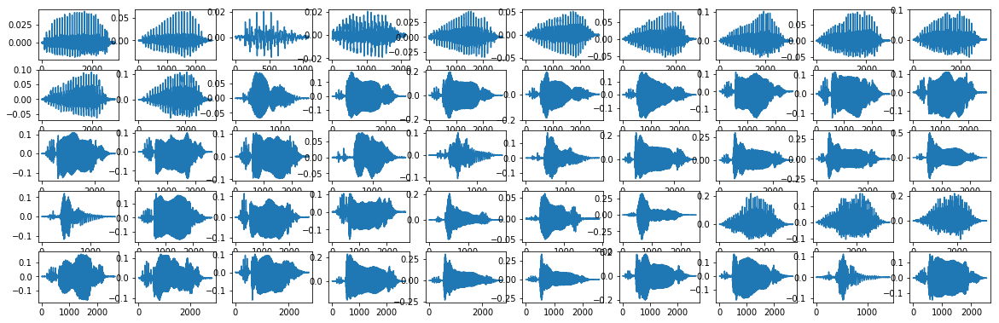

In [19]:
nrows = 5
ncols = 10
zoom = 2
fig, axs = plt.subplots(ncols=ncols, nrows = nrows,figsize = (ncols*zoom, nrows+zoom/1.5))
for i, syll in tqdm(enumerate(sylls), total = nrows*ncols):
    ax = axs.flatten()[i]
    ax.plot(syll)
    if i == nrows*ncols -1:
        break

In [20]:
syllable_df['audio'] = [i/np.max(i) for i in syllable_df.audio.values]

### Create spectrograms

In [21]:
from avgn.visualization.spectrogram import draw_spec_set
from avgn.signalprocessing.create_spectrogram_dataset import make_spec, mask_spec, log_resize_spec, pad_spectrogram

In [22]:
syllables_wav = syllable_df.audio.values
syllables_rate = syllable_df.rate.values

In [23]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    # create spectrograms
    syllables_spec = parallel(
        delayed(make_spec)(
            syllable,
            rate,
            hparams=dataset.hparams,
            mel_matrix=dataset.mel_matrix,
            use_mel=True,
            use_tensorflow=False,
        )
        for syllable, rate in tqdm(
            zip(syllables_wav, syllables_rate),
            total=len(syllables_rate),
            desc="getting syllable spectrograms",
            leave=False,
        )
    )

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1947s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0691s.) Setting batch_size=10.
[Parallel(n_jobs=-1)]: Done  77 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 105 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 139 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1671s.) Setting batch_size=22.
[Parallel(n_jobs=-1)]: Done 277 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 467 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Batch computation too fast (0

[Parallel(n_jobs=-1)]: Done 214925 out of 214925 | elapsed:  1.1min finished


### Rescale spectrogram
- using log rescaling

In [24]:
log_scaling_factor = 4

In [25]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    syllables_spec = parallel(
        delayed(log_resize_spec)(spec, scaling_factor=log_scaling_factor)
        for spec in tqdm(syllables_spec, desc="scaling spectrograms", leave=False)
    )

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0051s.) Setting batch_size=78.
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1326s.) Setting batch_size=234.
[Parallel(n_jobs=-1)]: Done 360 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 1062 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 3012 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 5586 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 8160 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 11202 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 14244 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 17754 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 21264 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 25242 tasks      | elapsed:    3

[Parallel(n_jobs=-1)]: Done 214925 out of 214925 | elapsed:   28.3s finished


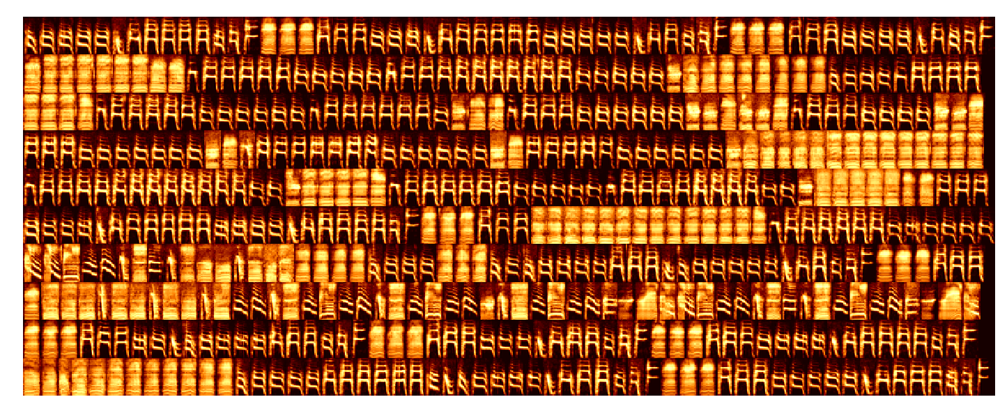

In [26]:
draw_spec_set(syllables_spec, zoom=1, maxrows=10, colsize=25)

### Pad spectrograms

In [27]:
syll_lens = [np.shape(i)[1] for i in syllables_spec]
pad_length = np.max(syll_lens)

In [28]:
syllable_df[:3]

,start_time,end_time,labels,sequence_num,indv,indvi,key,audio,rate
0,1.158,1.249,0,0,Bird3,0,Bird3_322,"[-0.009734488997989153, 0.003447199850403595, ...",32000
1,1.323,1.404,0,0,Bird3,0,Bird3_322,"[0.00291435508623854, 0.005482582600834766, -0...",32000
2,1.530,1.564,0,0,Bird3,0,Bird3_322,"[0.003216639465201797, 0.019389188093894005, 0...",32000


In [29]:
import seaborn as sns

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


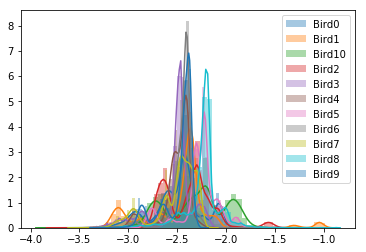

In [30]:
for indv in np.unique(syllable_df.indv):
    sns.distplot(np.log(syllable_df[syllable_df.indv==indv]["end_time"] - syllable_df[syllable_df.indv==indv]["start_time"]), label=indv)
plt.legend()

In [31]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:

    syllables_spec = parallel(
        delayed(pad_spectrogram)(spec, pad_length)
        for spec in tqdm(
            syllables_spec, desc="padding spectrograms", leave=False
        )
    )

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1791s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0297s.) Setting batch_size=26.
[Parallel(n_jobs=-1)]: Done  67 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0574s.) Setting batch_size=180.
[Parallel(n_jobs=-1)]: Done 145 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 395 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 865 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 2745 tasks      | elaps

[Parallel(n_jobs=-1)]: Done 214925 out of 214925 | elapsed:   24.6s finished


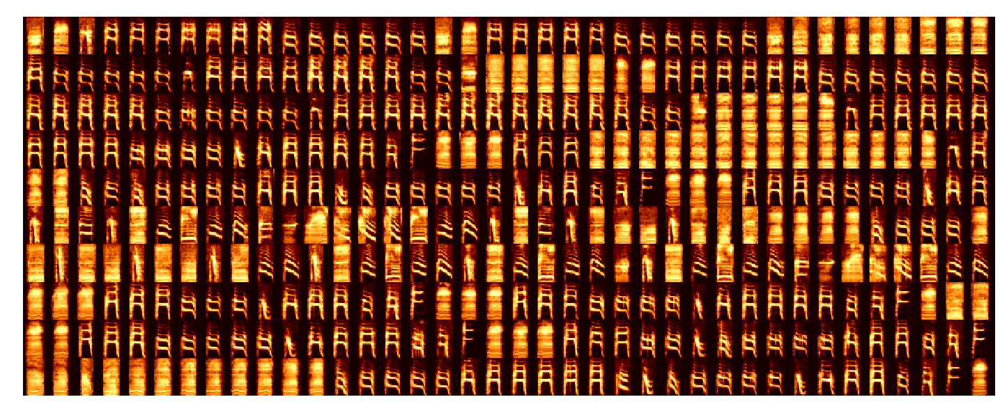

In [32]:
draw_spec_set(syllables_spec, zoom=1, maxrows=10, colsize=25)

In [33]:
np.shape(syllables_spec)

(214925, 32, 21)

In [34]:
def norm(x):
    return (x - np.min(x)) / (np.max(x) - np.min(x))
syllables_spec = [(norm(i)*255).astype('uint8') for i in tqdm(syllables_spec)]

In [35]:
# convert to uint8 to save space
syllable_df['spectrogram'] = syllables_spec

In [36]:
syllable_df[:3]

,start_time,end_time,labels,sequence_num,indv,indvi,key,audio,rate,spectrogram
0,1.158,1.249,0,0,Bird3,0,Bird3_322,"[-0.009734488997989153, 0.003447199850403595, ...",32000,"[[0, 0, 0, 110, 190, 203, 216, 217, 216, 219, ..."
1,1.323,1.404,0,0,Bird3,0,Bird3_322,"[0.00291435508623854, 0.005482582600834766, -0...",32000,"[[0, 0, 0, 54, 164, 182, 187, 191, 196, 196, 1..."
2,1.530,1.564,0,0,Bird3,0,Bird3_322,"[0.003216639465201797, 0.019389188093894005, 0...",32000,"[[0, 0, 0, 0, 0, 106, 100, 181, 209, 202, 196,..."


### view syllables per indv

In [37]:
syllable_df.indv.unique()

array(['Bird3', 'Bird1', 'Bird4', 'Bird6', 'Bird7', 'Bird9', 'Bird2',
       'Bird10', 'Bird5', 'Bird0', 'Bird8'], dtype=object)

Bird0 7652


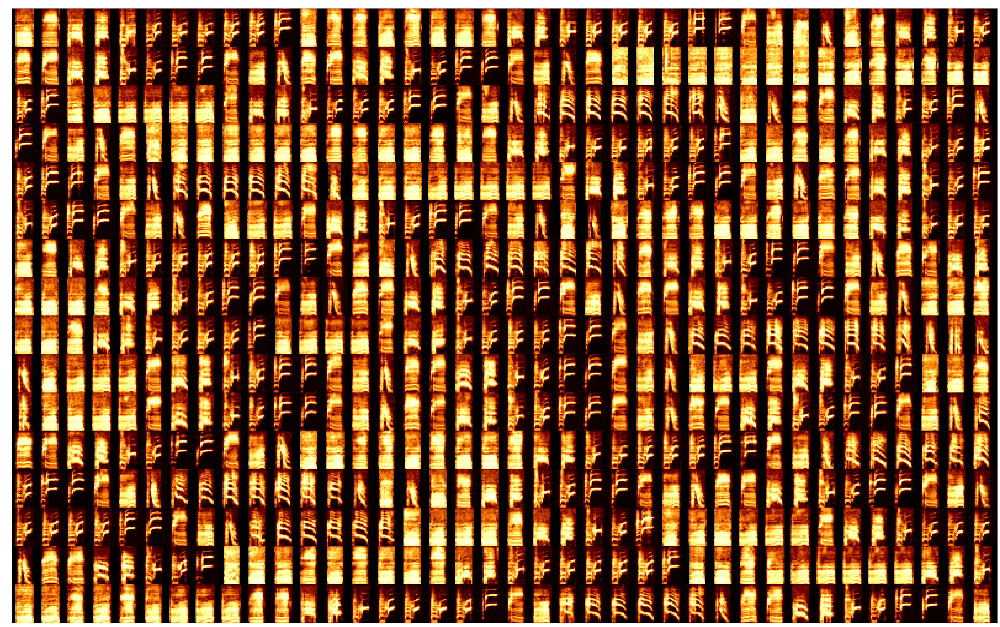

Bird1 35728


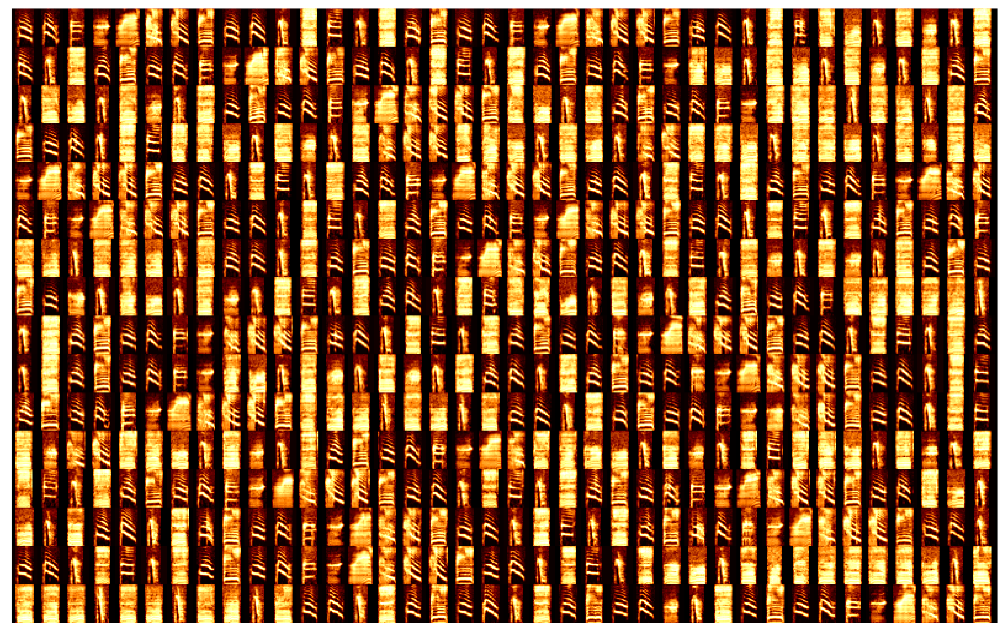

Bird10 5743


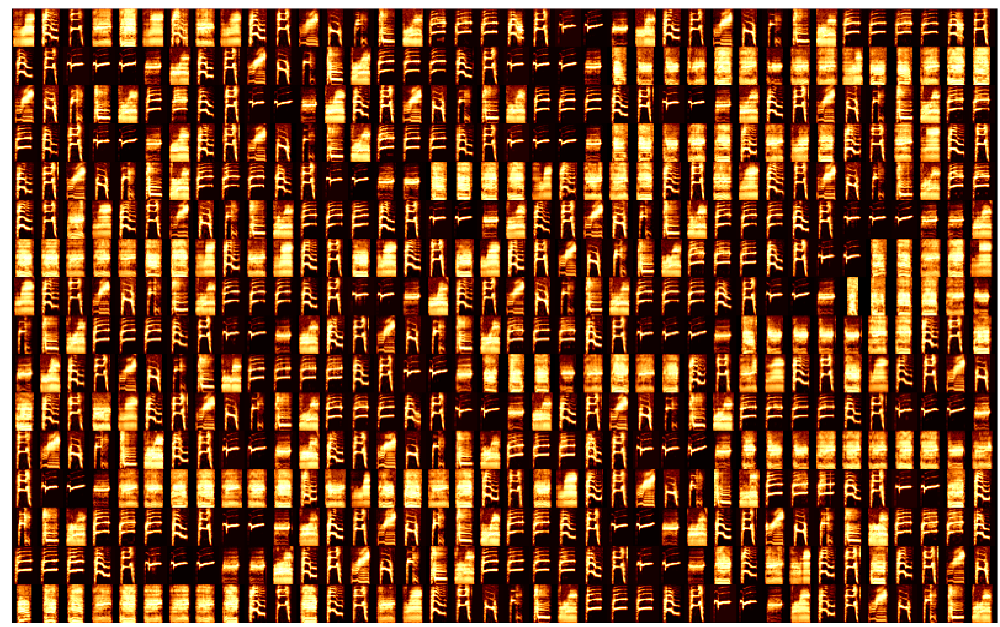

Bird2 26015


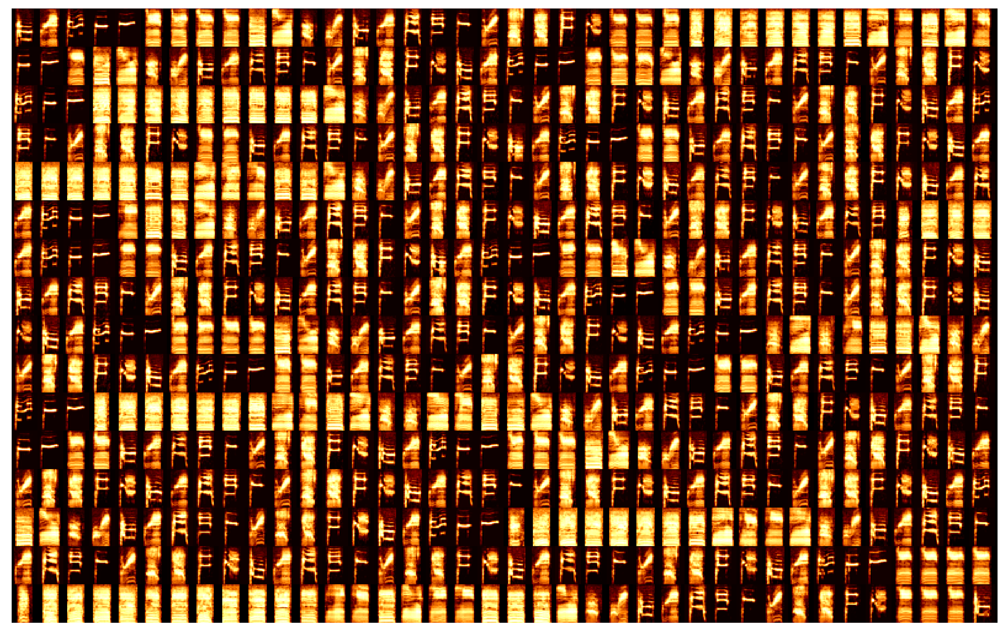

Bird3 29470


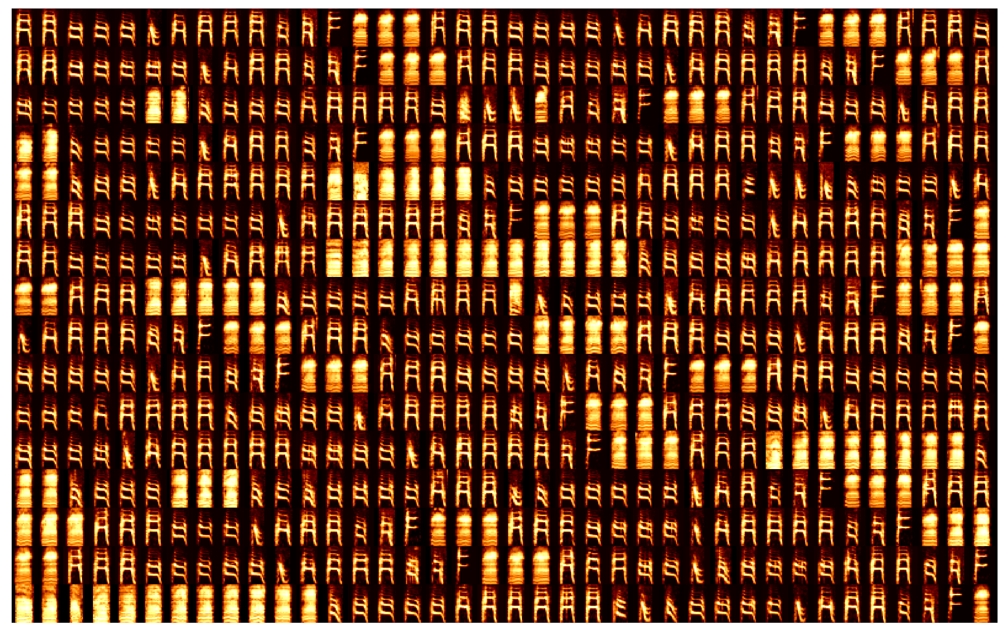

Bird4 26891


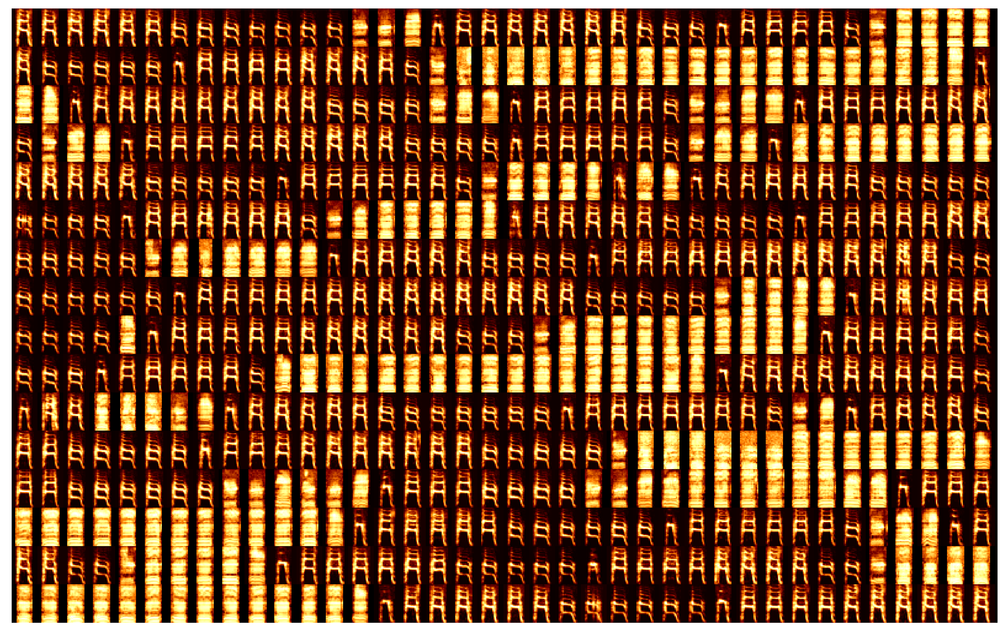

Bird5 20525


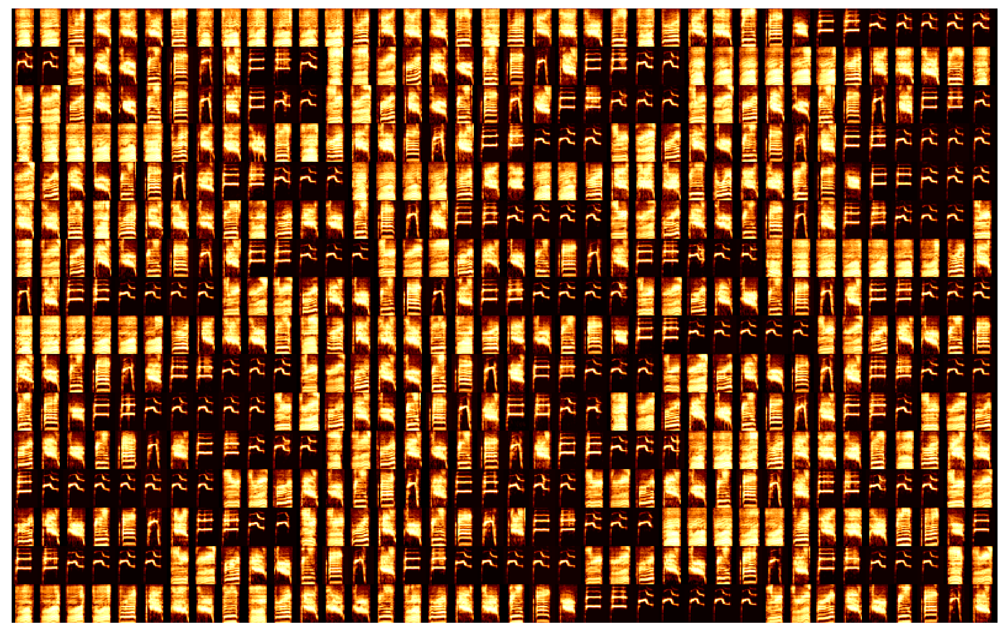

Bird6 17653


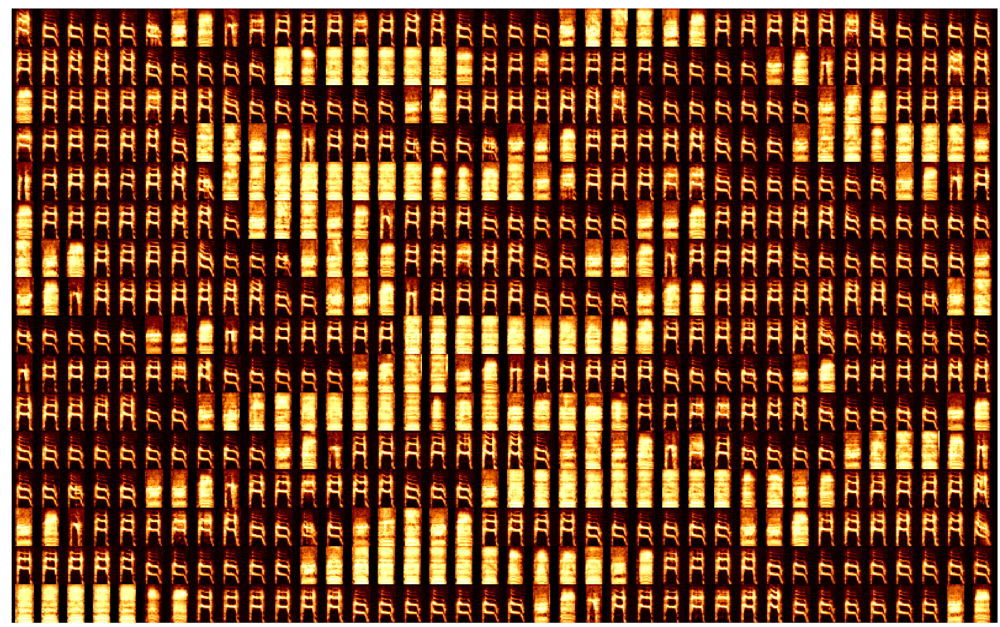

Bird7 20722


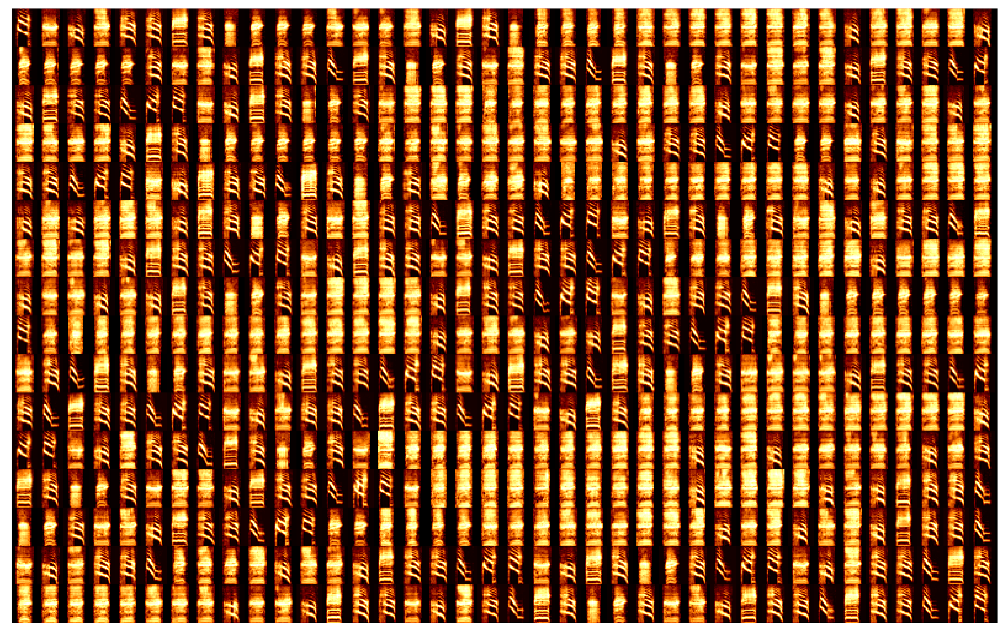

Bird8 4985


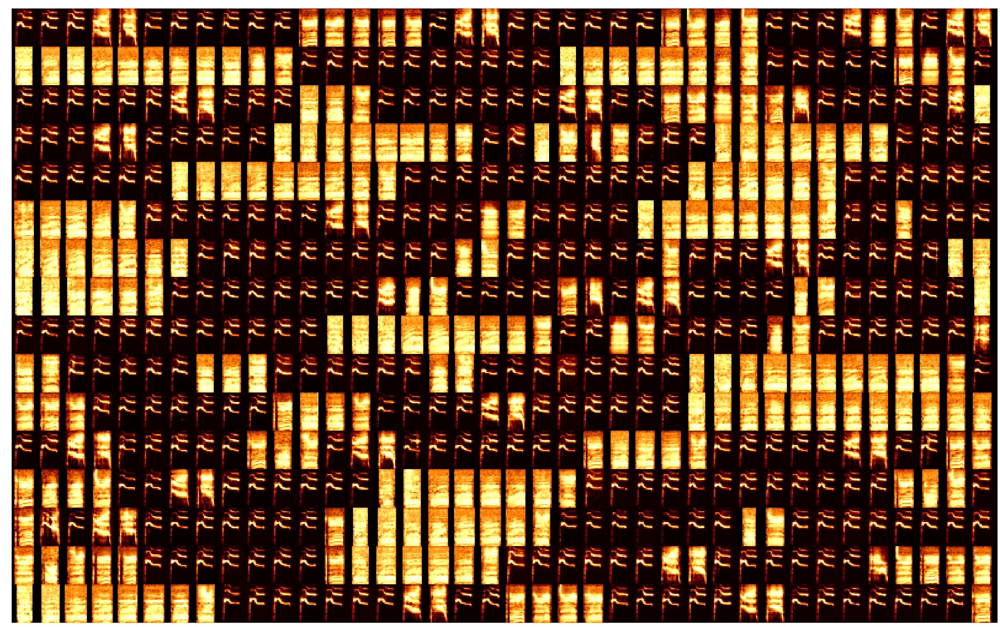

Bird9 19541


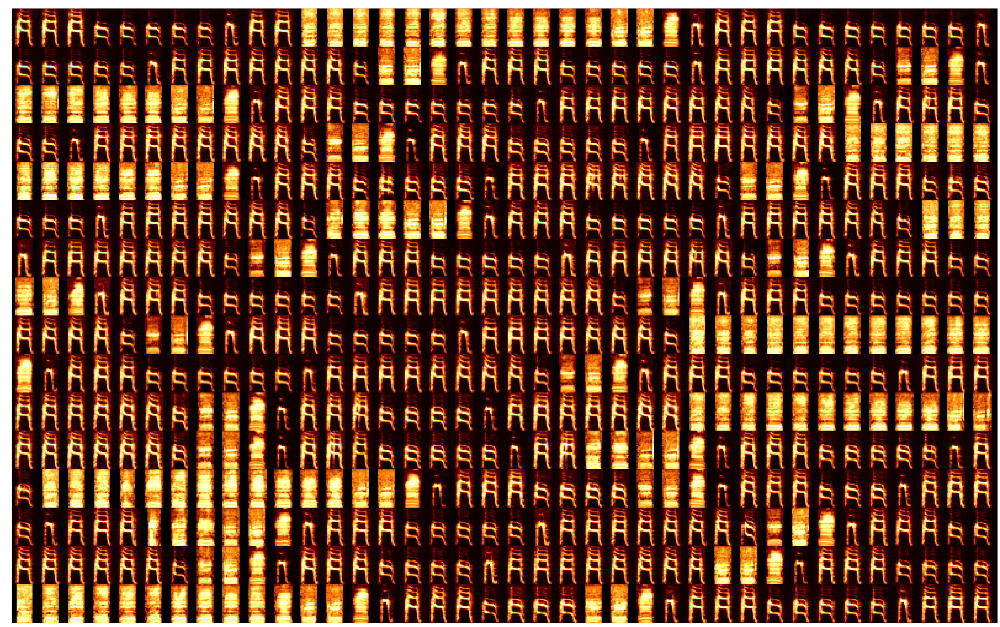

In [38]:
for indv in np.sort(syllable_df.indv.unique()):
    print(indv, np.sum(syllable_df.indv == indv))
    specs = np.array([i/np.max(i) for i in syllable_df[syllable_df.indv == indv].spectrogram.values])
    specs[specs<0] = 0
    draw_spec_set(specs, zoom=2,
                  maxrows=16, 
                  colsize=25)

### save dataset

In [39]:
save_loc = DATA_DIR / 'syllable_dfs' / DATASET_ID / 'bf.pickle'
ensure_dir(save_loc)
syllable_df.drop('audio', 1).to_pickle(save_loc)